In [1]:
%load_ext pretty_jupyter

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

## Helper functions

In [3]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [4]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [5]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [6]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [7]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [8]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [9]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [10]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [11]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

In [12]:
def cluster_means(adata, clusters):
    obs_clusters = adata.obs.groupby(clusters)
    
    out = pd.DataFrame(
        np.zeros((adata.shape[1], len(obs_clusters)), dtype=np.float64),
        columns = list(obs_clusters.groups.keys()),
        index = adata.var.index
    )

    for group, idx in obs_clusters.indices.items():
        X = adata.X[idx]
        out[group] = np.ravel(X.mean(axis=0, dtype=np.float64))
    return out

In [13]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

## Markers for dotplots

In [14]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [15]:
class_markers = [
    'AIM2', # Lower in early memory
    'CD27', # CD27+
    'CD69', # Activated
    'FAS',  # CD95+
    'IGHA1', # Class switching
    'IGHM', # Class switching
    'IGHD', # Class switching
    'IGHG1', # Class switching
    'ITGAX',# CD11c Memory vs Effector
    'MZB1', # Plasmablasts
    'PRDM1',# Plasmablasts
    'TBX21',# Tbet
    'XBP1', # Plasmablasts
    'ZEB2'  #
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [16]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

downloading fileID: 3868592c-0087-4ed8-98b2-4bf1b8676111
Files have been successfully downloaded!


In [17]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


## Read cell type hierarchy

In [18]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

downloading fileID: 1a44252c-8cab-4c8f-92c9-d8f3af633790
Files have been successfully downloaded!


## Identify files for use in HISE

In [19]:
search_id = 'platinum-gadolinium-calcium'

Retrieve files stored in our HISE project store

In [20]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [21]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [22]:
search_df['AIFI_L3'].tolist()

['Activated memory B cell',
 'CD27- effector B cell',
 'CD27+ effector B cell',
 'CD95 memory B cell',
 'Core memory B cell',
 'Core naive B cell',
 'Early memory B cell',
 'ISG+ naive B cell',
 'Plasma cell',
 'Transitional B cell',
 'Type 2 polarized memory B cell']

## Review Activated Memory B

In [202]:
cell_type = 'Activated memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [203]:
type_uuid

'3335cb36-cd22-4052-80f2-774cd3b8e646'

In [204]:
adata = read_adata_uuid(type_uuid)

### Clustering

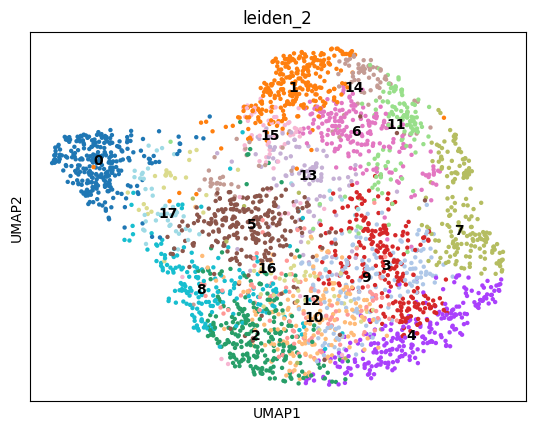

In [205]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

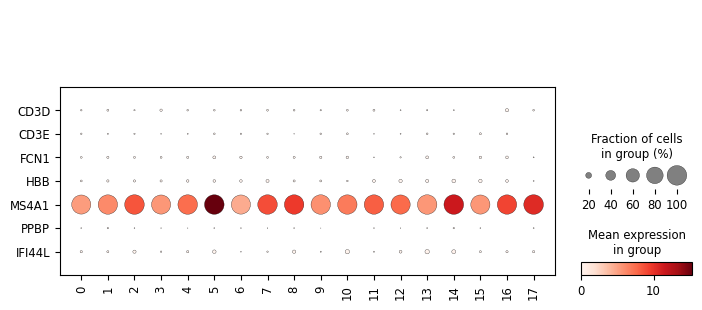

In [206]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

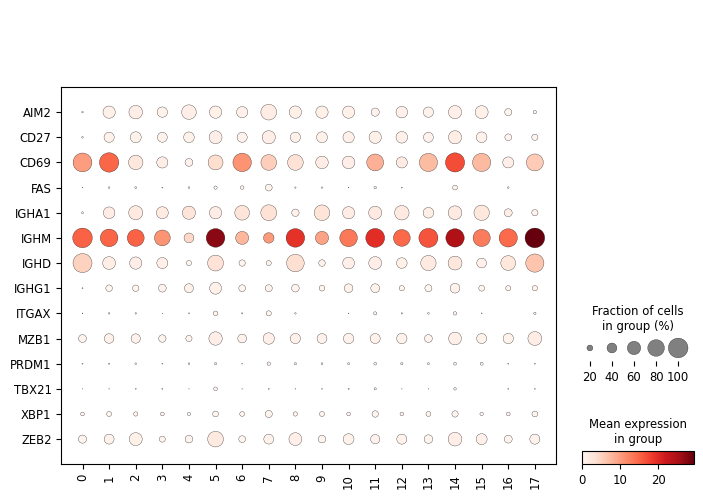

In [207]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

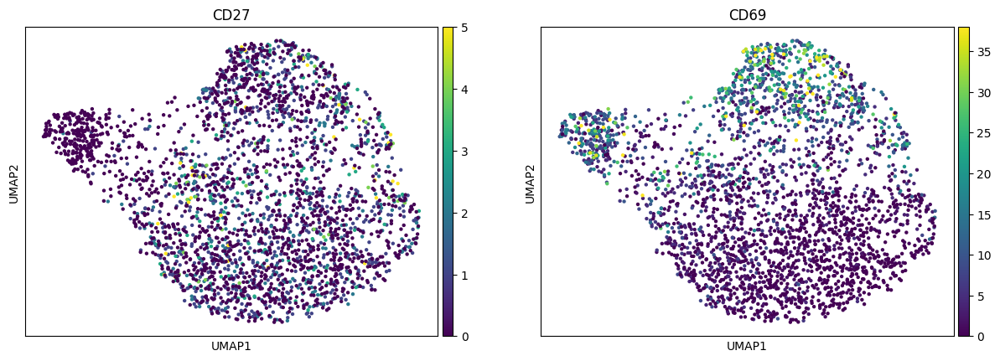

In [208]:
sc.pl.umap(adata, color = ['CD27','CD69'], vmax = 'p99')

### Cluster counts

In [209]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     287
1     276
2     254
3     242
4     242
5     232
6     190
7     185
8     176
9     167
10    164
11    125
12    105
13    102
14     92
15     61
16     54
17     51
Name: count, dtype: int64

### Investigating outliers

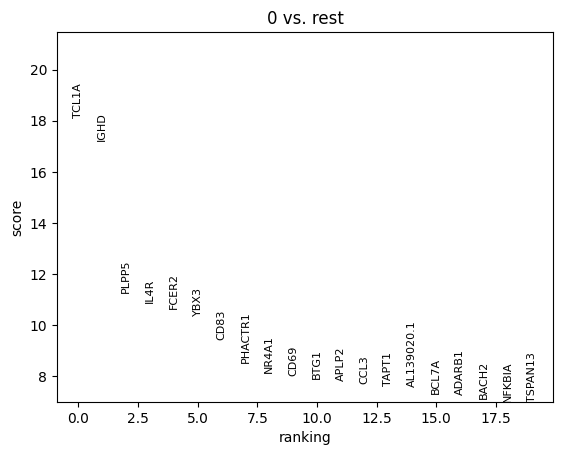

In [210]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['0']
)
sc.pl.rank_genes_groups(adata)

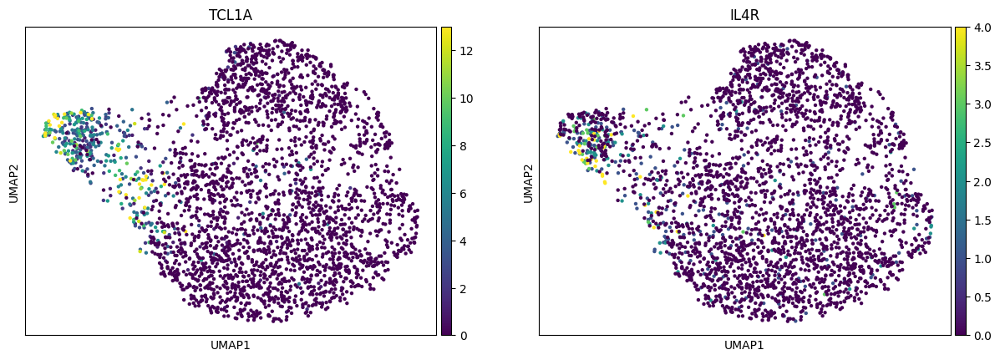

In [211]:
sc.pl.umap(adata, color = ['TCL1A','IL4R'], vmax = 'p99')

In [212]:
sc.pp.highly_variable_genes(adata)

In [213]:
hv_adata = adata[:,adata.var.highly_variable]
cl_means = cluster_means(hv_adata, 'leiden_2')
cl_means = cl_means.to_numpy().T

In [214]:
ac = AgglomerativeClustering(distance_threshold=0, linkage = 'average', n_clusters=None)
cl_hc = ac.fit(cl_means)

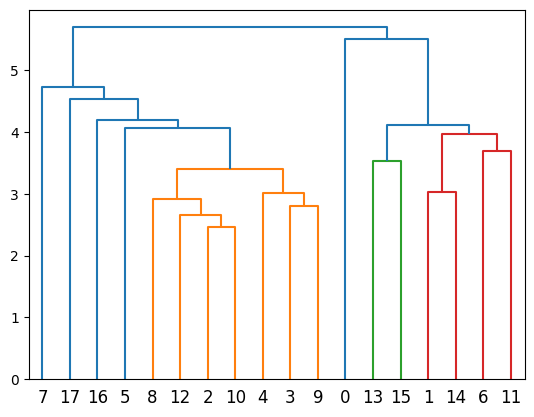

In [215]:
plot_dendrogram(cl_hc)

### Comparison to original labels

In [216]:
adata = add_labels(adata, original_df)

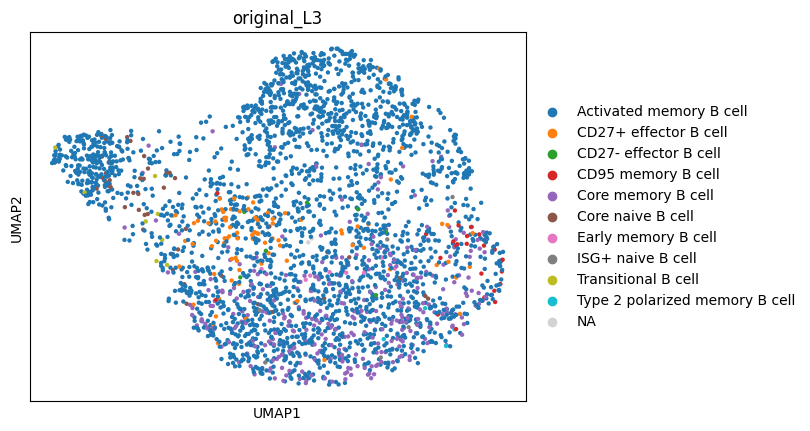

In [217]:
sc.pl.umap(adata, color = 'original_L3')

In [218]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Activated memory B cell           2471
Core memory B cell                 336
CD27+ effector B cell               87
Core naive B cell                   47
CD95 memory B cell                  25
Transitional B cell                 10
Early memory B cell                  8
CD27- effector B cell                7
ISG+ naive B cell                    6
Type 2 polarized memory B cell       4
NaN                                  4
Name: count, dtype: int64

In [219]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Activated memory B cell           0.822296
Core memory B cell                0.111814
CD27+ effector B cell             0.028952
Core naive B cell                 0.015641
CD95 memory B cell                0.008319
Transitional B cell               0.003328
Early memory B cell               0.002662
CD27- effector B cell             0.002329
ISG+ naive B cell                 0.001997
Type 2 polarized memory B cell    0.001331
NaN                               0.001331
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review CD27- effector B cell

In [220]:
cell_type = 'CD27- effector B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [221]:
type_uuid

'5775d25b-1236-49e4-8e13-4c058a89bc28'

In [222]:
adata = read_adata_uuid(type_uuid)

### Clustering

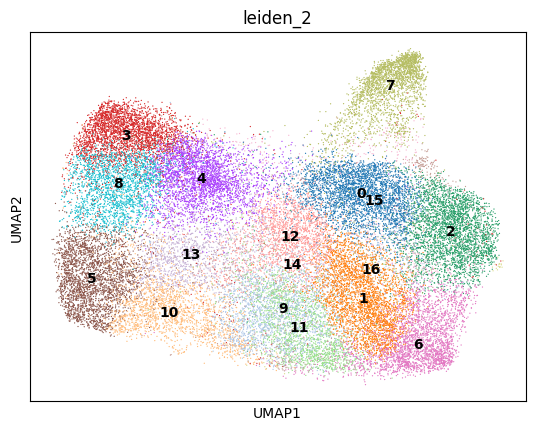

In [223]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

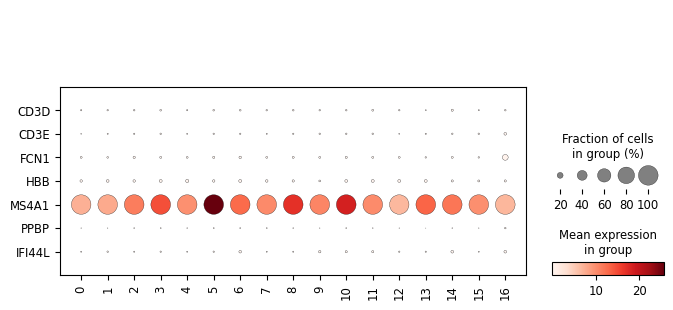

In [224]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

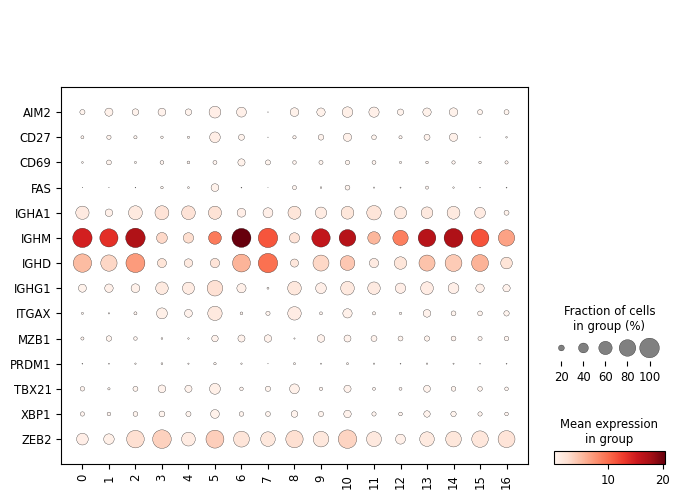

In [225]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

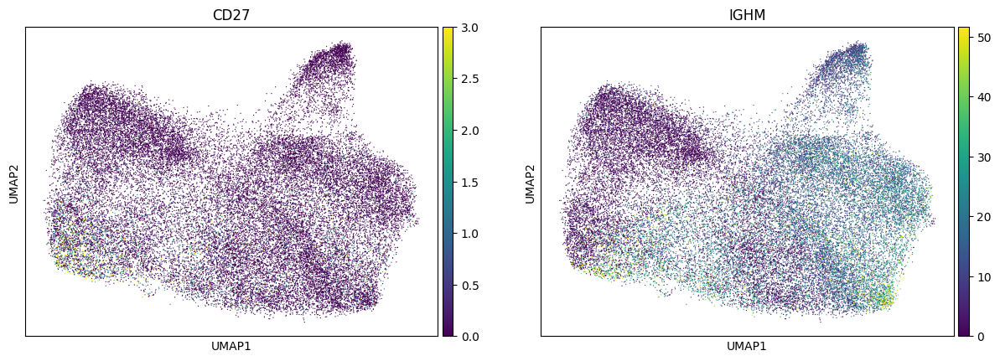

In [226]:
sc.pl.umap(adata, color = ['CD27','IGHM'], vmax = 'p99')

### Cluster counts

In [227]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     3231
1     3127
2     3088
3     3032
4     3023
5     2780
6     2775
7     2497
8     2176
9     2148
10    1966
11    1838
12    1702
13    1210
14     717
15     566
16      56
Name: count, dtype: int64

### Investigating outliers

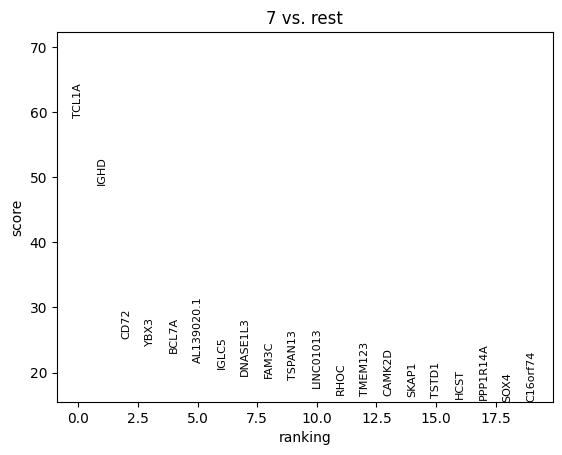

In [228]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['7']
)
sc.pl.rank_genes_groups(adata)

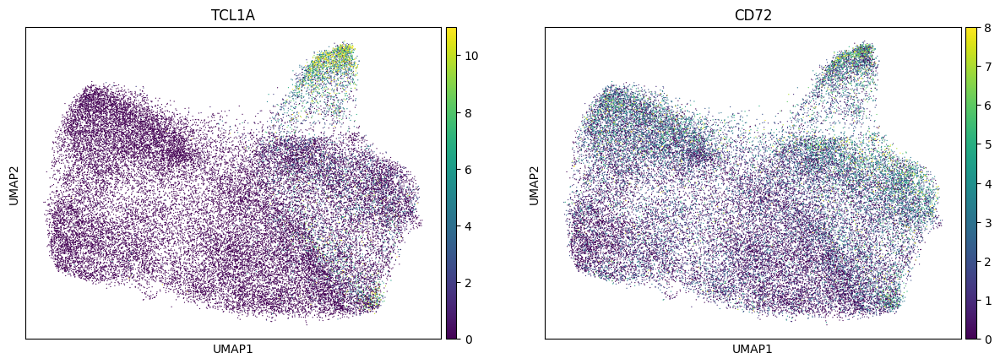

In [229]:
sc.pl.umap(adata, color = ['TCL1A','CD72'], vmax = 'p99')

### Comparison to original labels

In [230]:
adata = add_labels(adata, original_df)

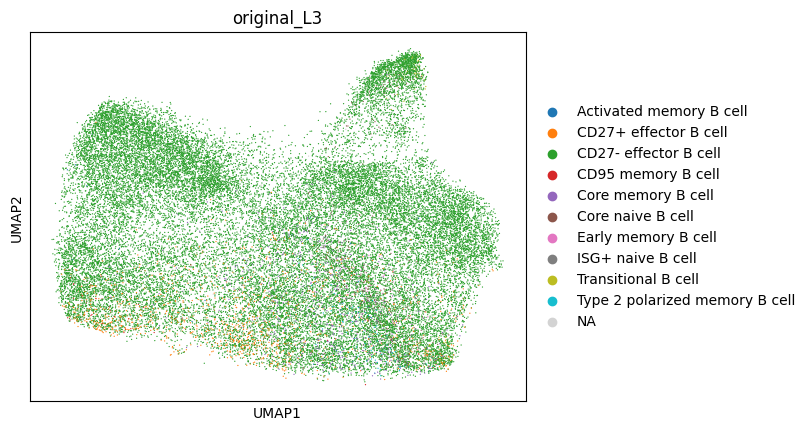

In [231]:
sc.pl.umap(adata, color = 'original_L3')

In [232]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD27- effector B cell             33165
CD27+ effector B cell              1255
Core memory B cell                  606
Core naive B cell                   430
Type 2 polarized memory B cell      110
Transitional B cell                 104
Early memory B cell                  88
NaN                                  72
CD95 memory B cell                   42
ISG+ naive B cell                    42
Activated memory B cell              18
Name: count, dtype: int64

In [233]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD27- effector B cell             0.922993
CD27+ effector B cell             0.034927
Core memory B cell                0.016865
Core naive B cell                 0.011967
Type 2 polarized memory B cell    0.003061
Transitional B cell               0.002894
Early memory B cell               0.002449
NaN                               0.002004
CD95 memory B cell                0.001169
ISG+ naive B cell                 0.001169
Activated memory B cell           0.000501
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review CD27+ effector B cell

In [234]:
cell_type = 'CD27+ effector B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [235]:
type_uuid

'76c7385f-2043-4a0f-9e25-81afe2acab9b'

In [236]:
adata = read_adata_uuid(type_uuid)

### Clustering

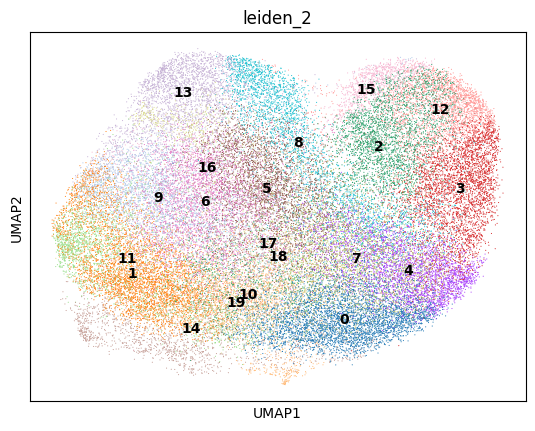

In [237]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

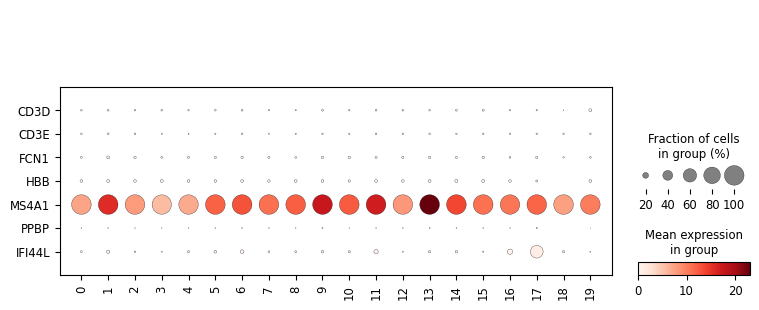

In [238]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

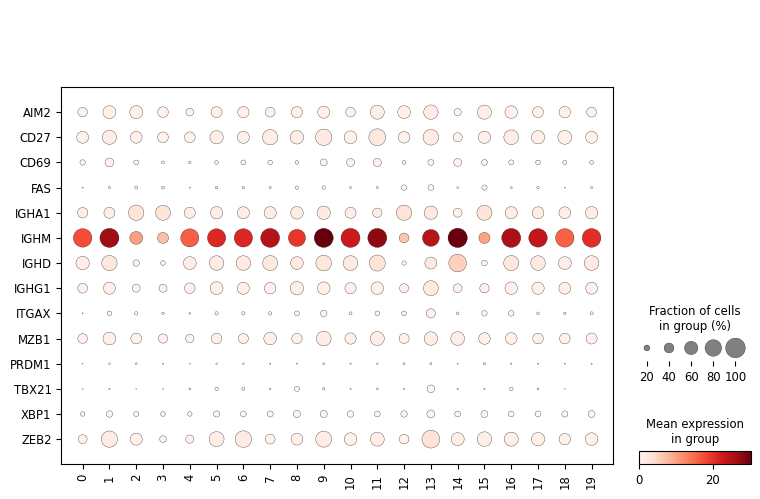

In [239]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

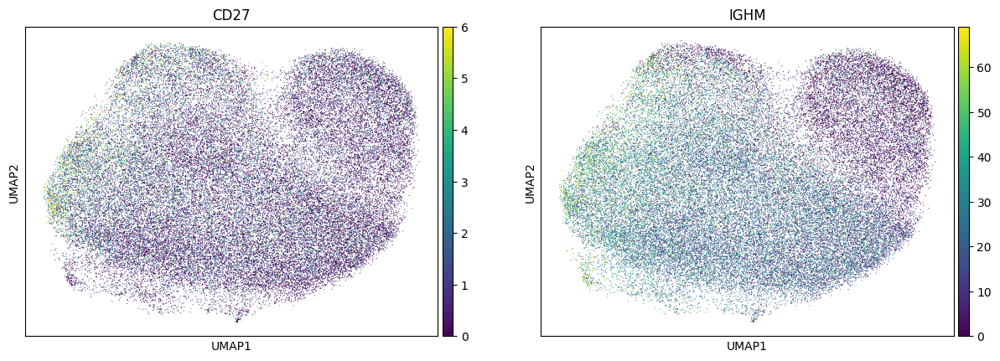

In [240]:
sc.pl.umap(adata, color = ['CD27','IGHM'], vmax = 'p99')

### Cluster counts

In [241]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     4261
1     4154
2     3617
3     3591
4     3280
5     3278
6     3194
7     2958
8     2943
9     2865
10    2765
11    2706
12    2688
13    2573
14    1897
15    1207
16     986
17     373
18     172
19     162
Name: count, dtype: int64

### Investigating outliers

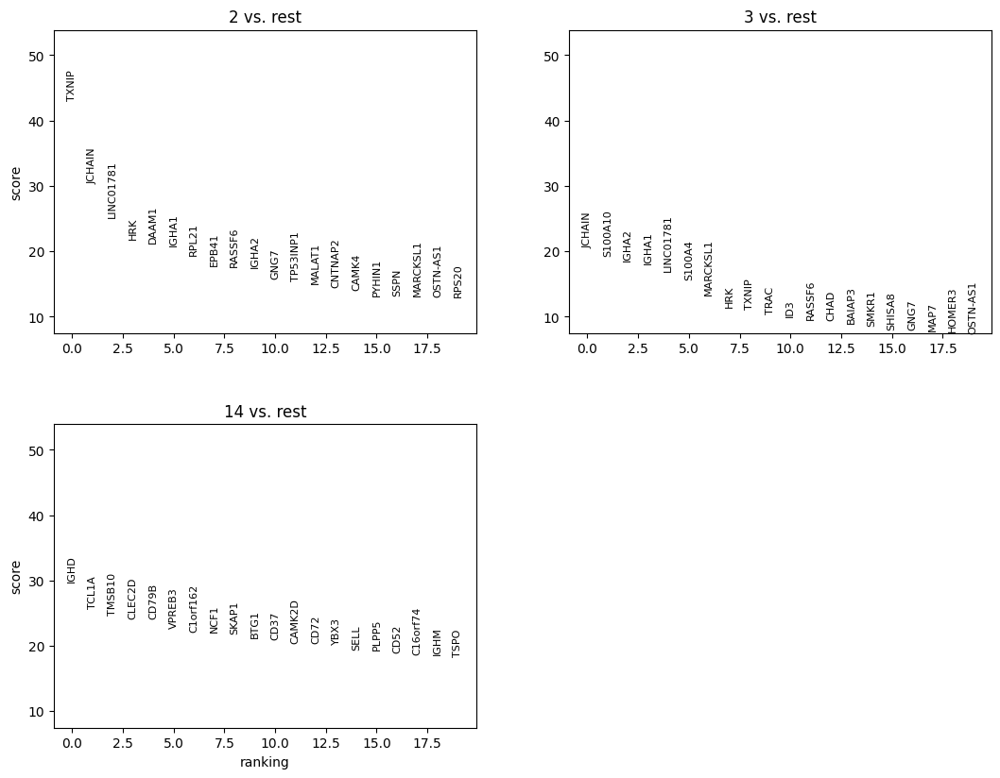

In [242]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['2','3','14']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

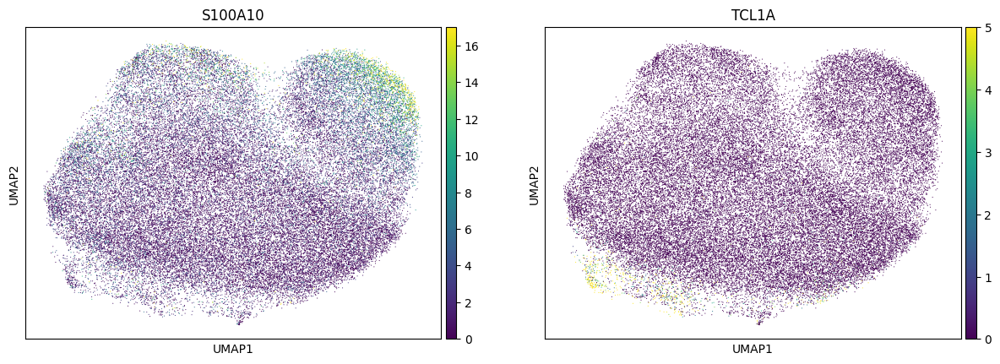

In [243]:
sc.pl.umap(adata, color = ['S100A10','TCL1A'], vmax = 'p99')

### Comparison to original labels

In [244]:
adata = add_labels(adata, original_df)

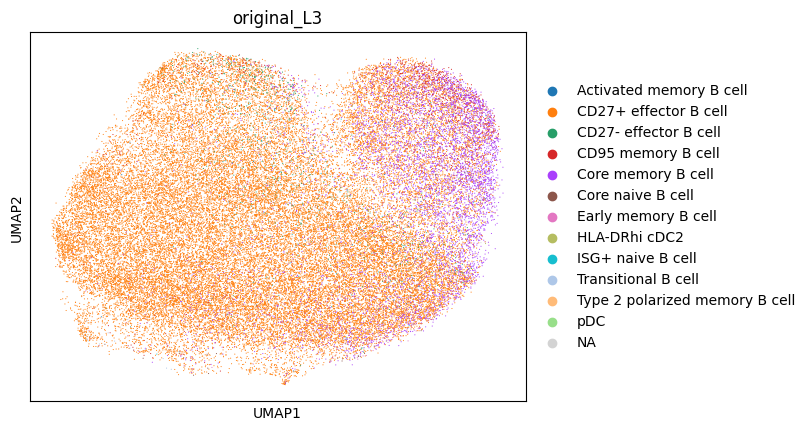

In [245]:
sc.pl.umap(adata, color = 'original_L3')

In [246]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD27+ effector B cell             41137
Core memory B cell                 6194
CD95 memory B cell                 1044
CD27- effector B cell               788
NaN                                 165
Early memory B cell                 126
ISG+ naive B cell                   110
Core naive B cell                    43
Activated memory B cell              27
Transitional B cell                  23
Type 2 polarized memory B cell       11
HLA-DRhi cDC2                         1
pDC                                   1
Name: count, dtype: int64

In [247]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD27+ effector B cell             0.828206
Core memory B cell                0.124703
CD95 memory B cell                0.021019
CD27- effector B cell             0.015865
NaN                               0.003322
Early memory B cell               0.002537
ISG+ naive B cell                 0.002215
Core naive B cell                 0.000866
Activated memory B cell           0.000544
Transitional B cell               0.000463
Type 2 polarized memory B cell    0.000221
HLA-DRhi cDC2                     0.000020
pDC                               0.000020
Name: count, dtype: float64

### Proposed updates

Should IgM- cells move to Core Memory B cell?

## Review CD95 memory B cell

In [248]:
cell_type = 'CD95 memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [249]:
type_uuid

'6678d956-276a-4cf2-9f48-383baa136ff2'

In [250]:
adata = read_adata_uuid(type_uuid)

### Clustering

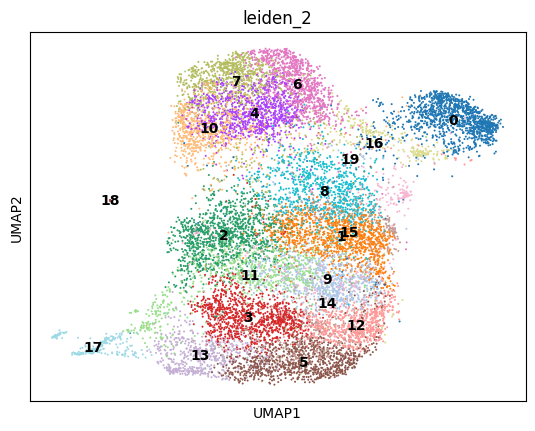

In [251]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

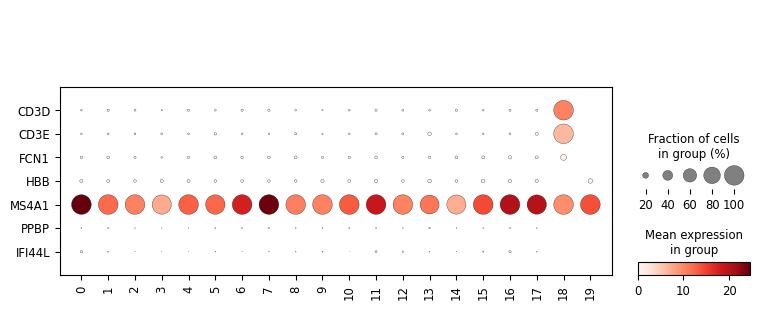

In [252]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

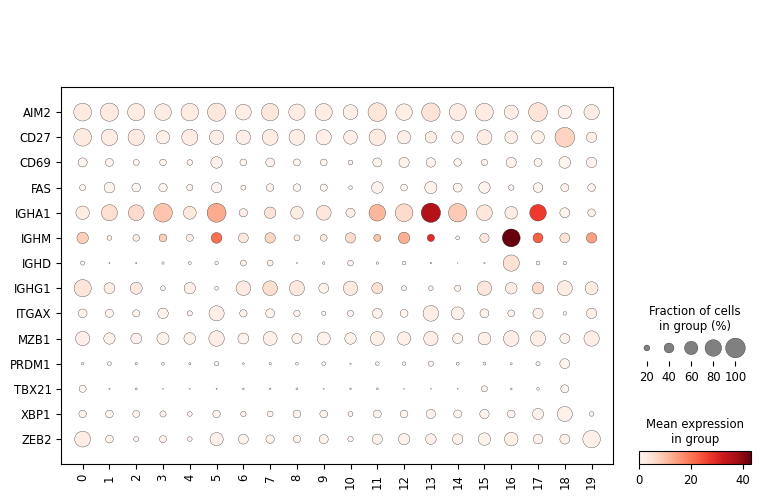

In [253]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

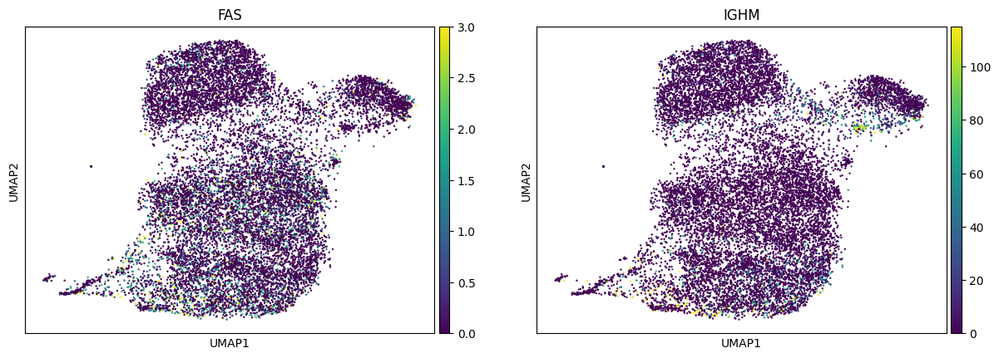

In [254]:
sc.pl.umap(adata, color = ['FAS','IGHM'], vmax = 'p99', size = 12)

### Cluster counts

In [255]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1261
1     1182
2     1163
3     1052
4      986
5      965
6      925
7      882
8      856
9      804
10     783
11     778
12     680
13     593
14     542
15     332
16     282
17     258
18      10
19       7
Name: count, dtype: int64

### Investigating outliers

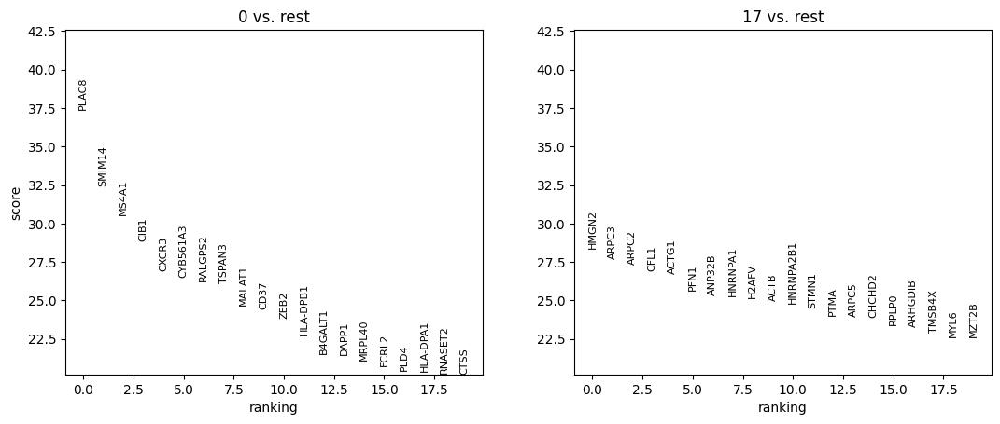

In [256]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['0','17']
)
sc.pl.rank_genes_groups(adata)

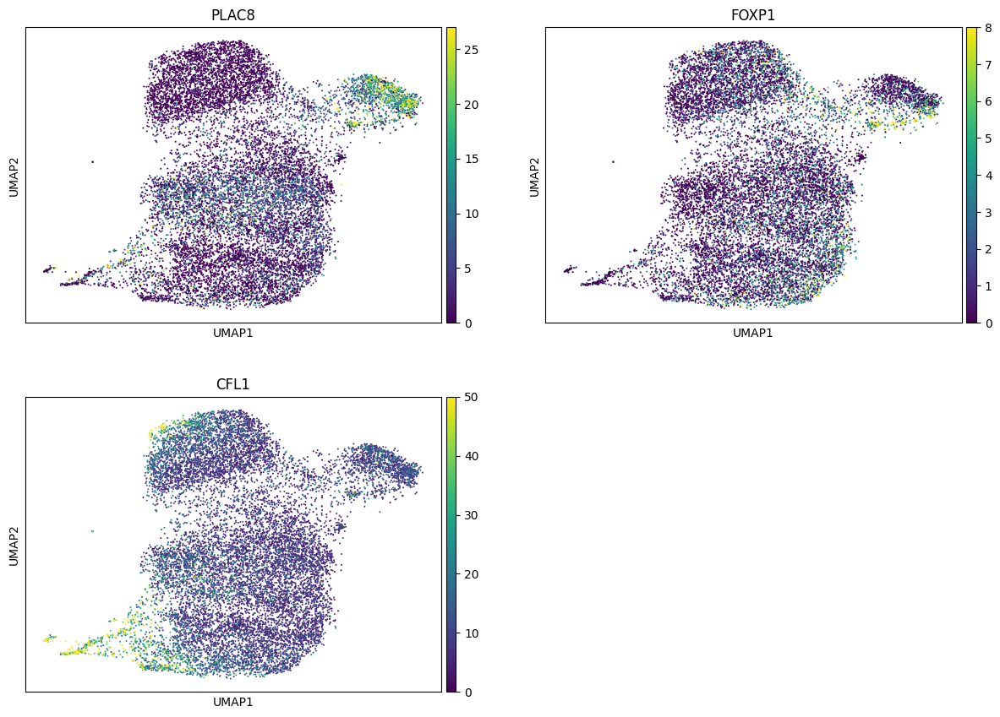

In [258]:
sc.pl.umap(adata, color = ['PLAC8','FOXP1','CFL1'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [259]:
adata = add_labels(adata, original_df)

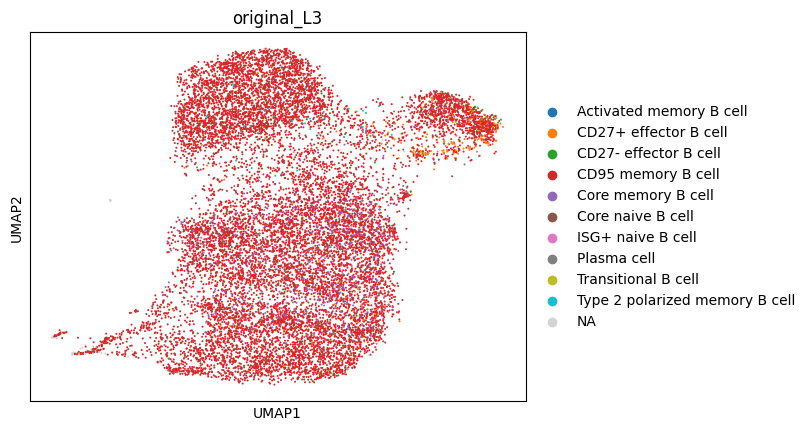

In [260]:
sc.pl.umap(adata, color = 'original_L3')

In [261]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD95 memory B cell                12958
Core memory B cell                  830
CD27+ effector B cell               308
NaN                                 124
Type 2 polarized memory B cell       41
CD27- effector B cell                28
ISG+ naive B cell                    22
Transitional B cell                  10
Activated memory B cell               8
Plasma cell                           7
Core naive B cell                     5
Name: count, dtype: int64

In [262]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD95 memory B cell                0.903563
Core memory B cell                0.057876
CD27+ effector B cell             0.021477
NaN                               0.008647
Type 2 polarized memory B cell    0.002859
CD27- effector B cell             0.001952
ISG+ naive B cell                 0.001534
Transitional B cell               0.000697
Activated memory B cell           0.000558
Plasma cell                       0.000488
Core naive B cell                 0.000349
Name: count, dtype: float64

### Proposed updates

Remove T cell doublets (CD3D+ cluster 18)

## Review Core memory B cell

In [263]:
cell_type = 'Core memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [264]:
type_uuid

'ac728065-07b8-4cd8-b287-34baf11c2a8b'

In [265]:
adata = read_adata_uuid(type_uuid)

### Clustering

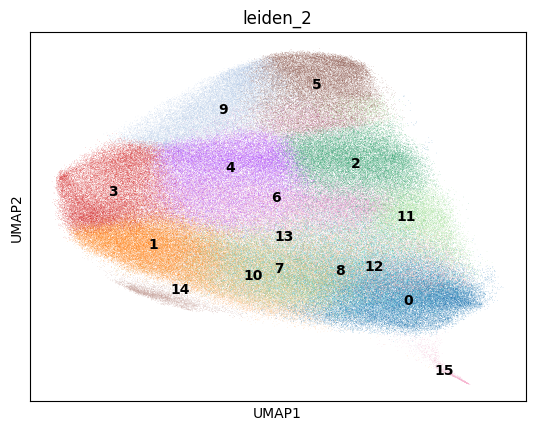

In [266]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

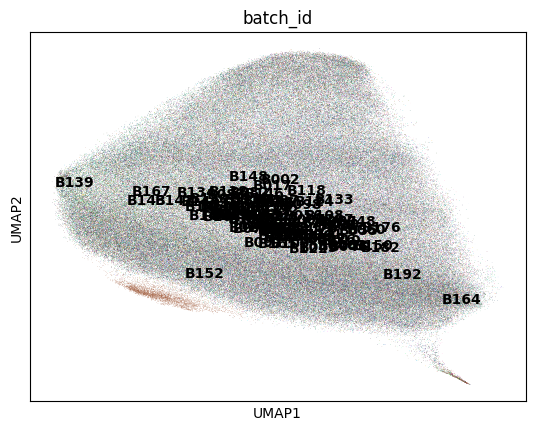

In [267]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

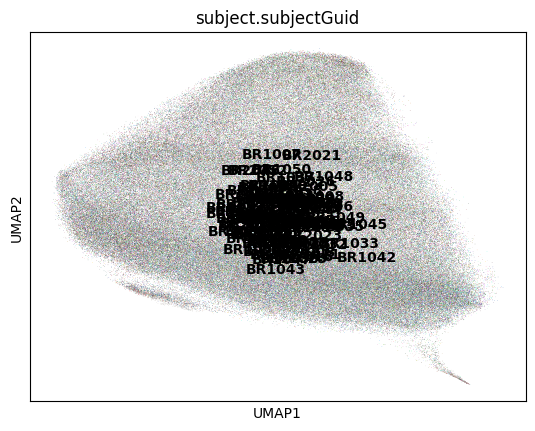

In [268]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

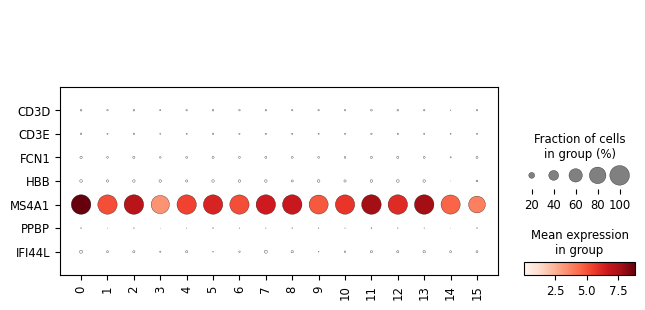

In [269]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

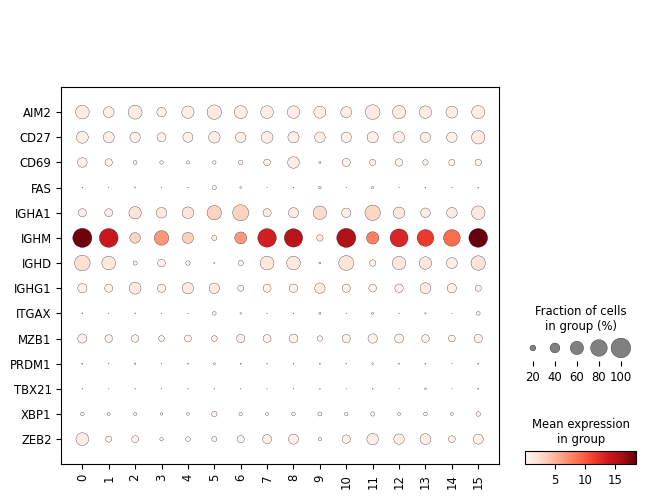

In [270]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Investigating outliers

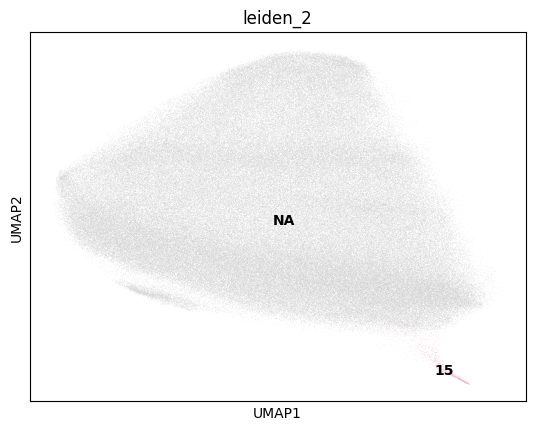

In [271]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = ['15'])

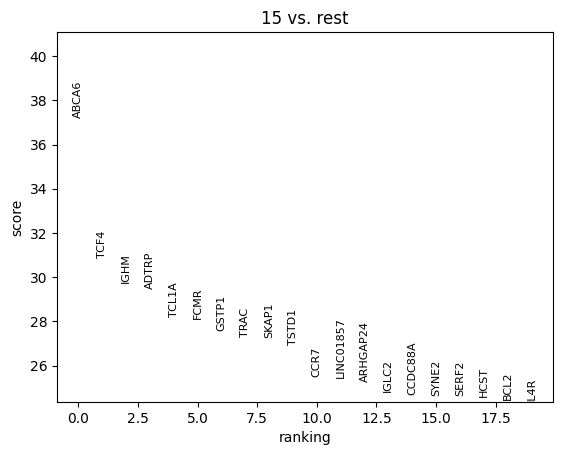

In [272]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['15']
)
sc.pl.rank_genes_groups(adata)

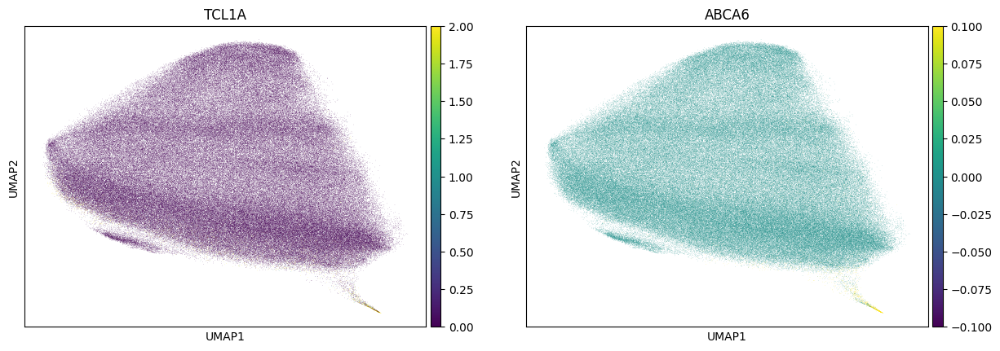

In [273]:
sc.pl.umap(adata, color = ['TCL1A','ABCA6'], vmax = 'p99')

### Comparison to original labels

In [274]:
adata = add_labels(adata, original_df)

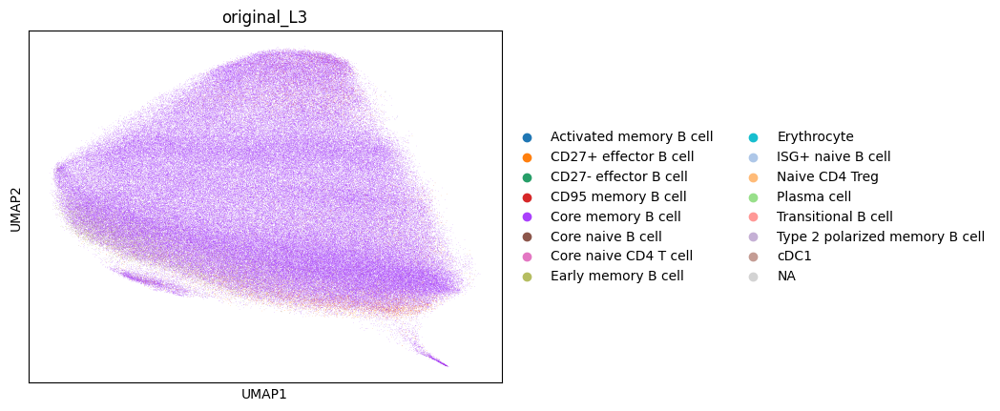

In [275]:
sc.pl.umap(adata, color = 'original_L3')

In [276]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core memory B cell                282704
CD27+ effector B cell               7878
Early memory B cell                 7735
CD95 memory B cell                  2938
Type 2 polarized memory B cell      2855
NaN                                 1881
Core naive B cell                   1718
ISG+ naive B cell                    806
CD27- effector B cell                734
Activated memory B cell              335
Transitional B cell                   18
Erythrocyte                            3
Plasma cell                            3
Core naive CD4 T cell                  2
Naive CD4 Treg                         1
cDC1                                   1
Name: count, dtype: int64

In [277]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core memory B cell                0.913091
CD27+ effector B cell             0.025445
Early memory B cell               0.024983
CD95 memory B cell                0.009489
Type 2 polarized memory B cell    0.009221
NaN                               0.006075
Core naive B cell                 0.005549
ISG+ naive B cell                 0.002603
CD27- effector B cell             0.002371
Activated memory B cell           0.001082
Transitional B cell               0.000058
Erythrocyte                       0.000010
Plasma cell                       0.000010
Core naive CD4 T cell             0.000006
Naive CD4 Treg                    0.000003
cDC1                              0.000003
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review Core naive B cell

In [168]:
cell_type = 'Core naive B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [169]:
type_uuid

'c8f341c2-a89e-4bae-ab03-1147e258ca8d'

In [170]:
adata = read_adata_uuid(type_uuid)

### Clustering

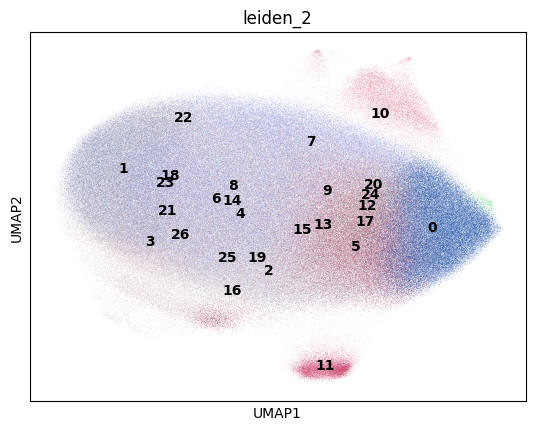

In [171]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

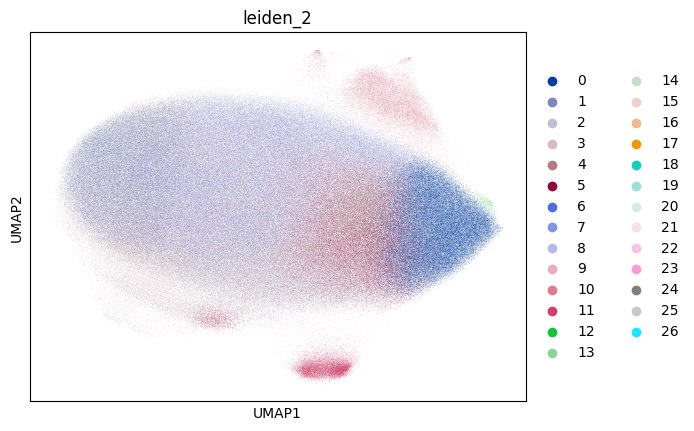

In [172]:
sc.pl.umap(adata, color = 'leiden_2')

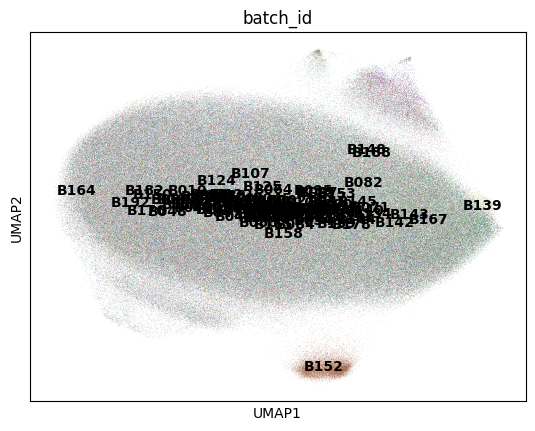

In [173]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

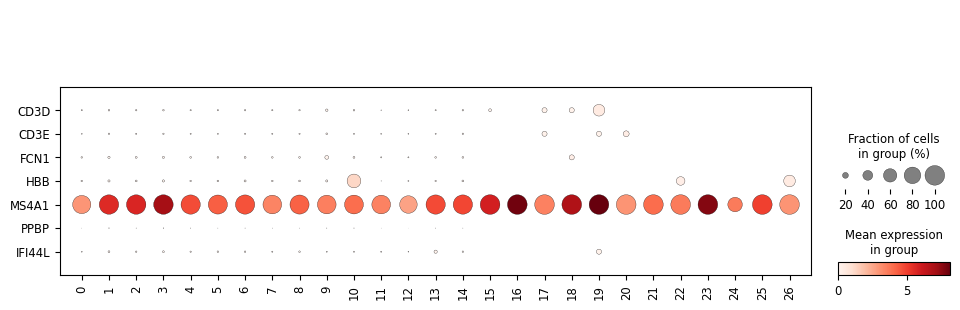

In [174]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

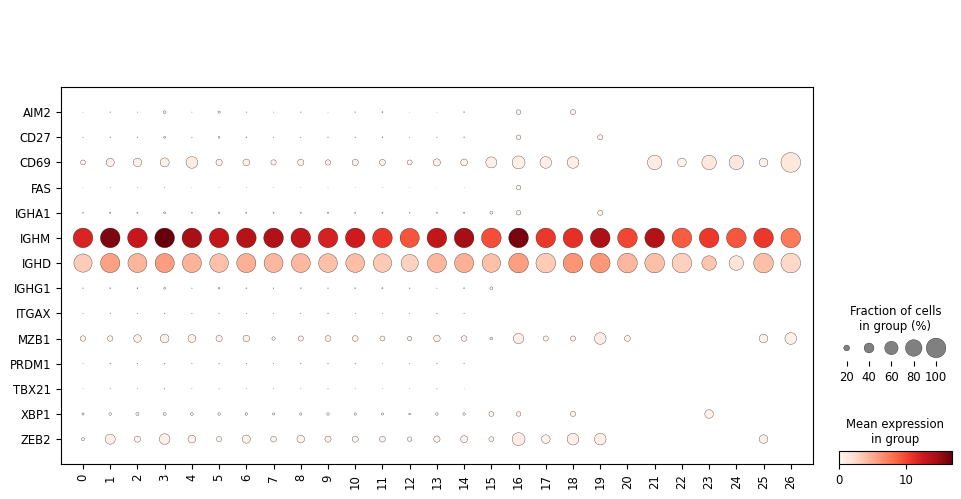

In [175]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

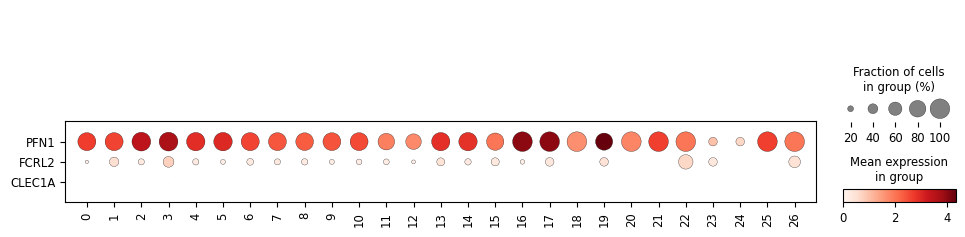

In [188]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['PFN1','FCRL2','CLEC1A'], swap_axes = True)

### Outlier investigation

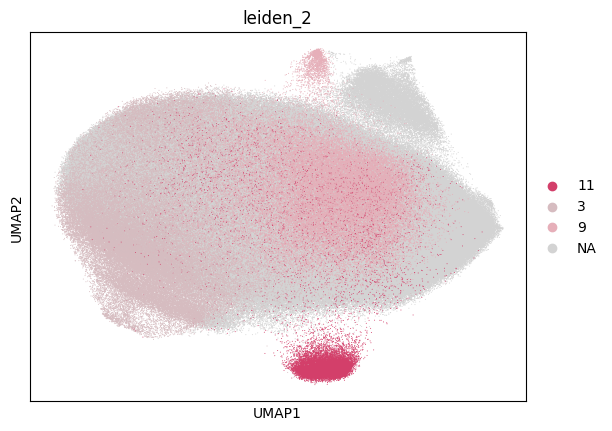

In [192]:
sc.pl.umap(adata, color = 'leiden_2', groups = ['9','11','3'], size = 2)

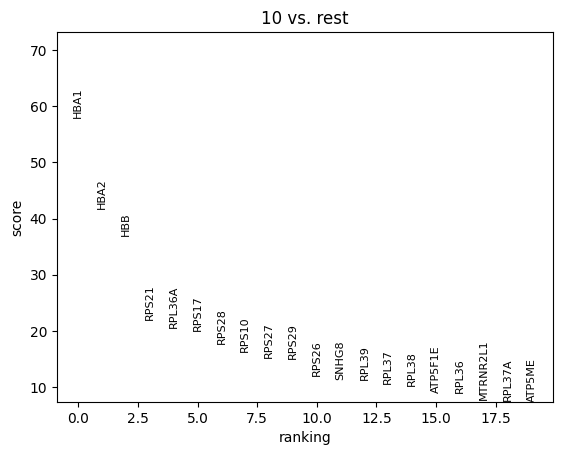

In [177]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['10']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

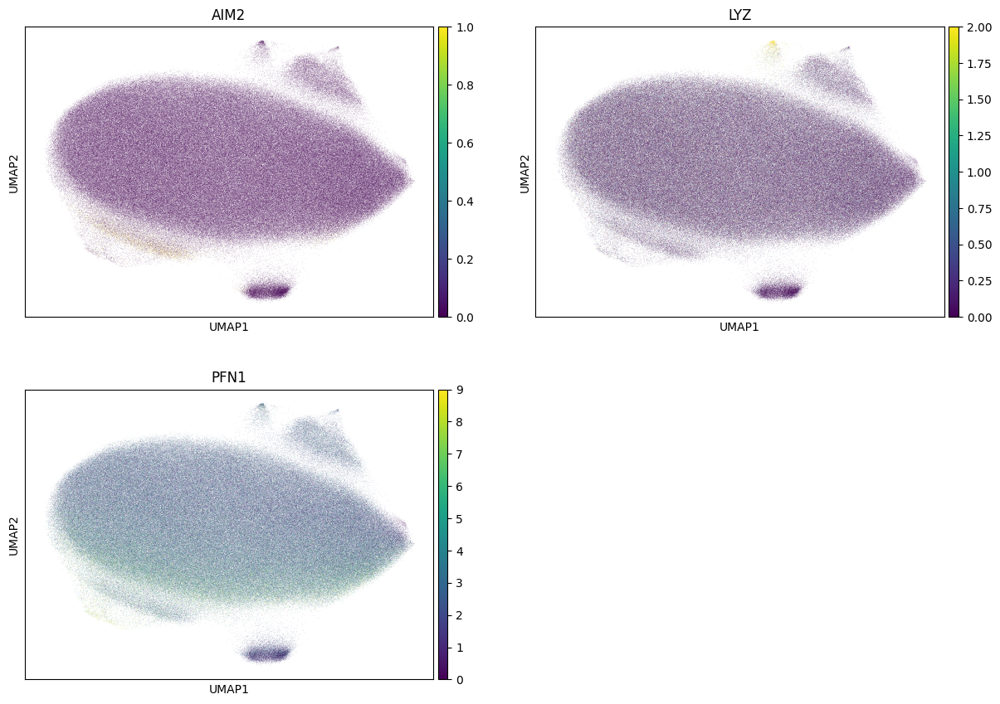

In [178]:
sc.pl.umap(adata, color = ['AIM2','LYZ','PFN1'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [179]:
adata = add_labels(adata, original_df)

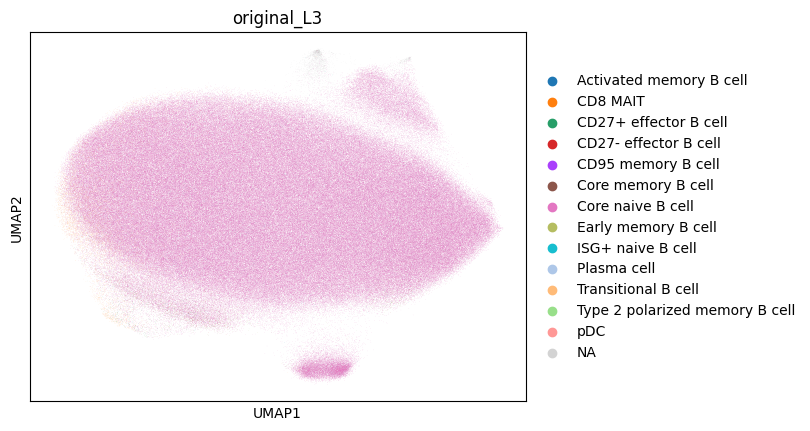

In [180]:
sc.pl.umap(adata, color = 'original_L3')

In [181]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core naive B cell                 629981
Transitional B cell                11472
NaN                                10243
Core memory B cell                  2053
ISG+ naive B cell                   2044
Early memory B cell                 1436
Type 2 polarized memory B cell       762
CD27- effector B cell                663
CD27+ effector B cell                190
Activated memory B cell               60
CD95 memory B cell                    38
CD8 MAIT                               1
Plasma cell                            1
pDC                                    1
Name: count, dtype: int64

In [182]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core naive B cell                 0.956045
Transitional B cell               0.017410
NaN                               0.015545
Core memory B cell                0.003116
ISG+ naive B cell                 0.003102
Early memory B cell               0.002179
Type 2 polarized memory B cell    0.001156
CD27- effector B cell             0.001006
CD27+ effector B cell             0.000288
Activated memory B cell           0.000091
CD95 memory B cell                0.000058
CD8 MAIT                          0.000002
Plasma cell                       0.000002
pDC                               0.000002
Name: count, dtype: float64

### Proposed updates

- Iteratively cluster to remove high LYZ-expressing cluster (9) as possible Myeloid doublet
- Iteratively cluster to remove high PFN-expressing cluster (3) as mislabeled

## Review Early memory B cell

In [193]:
cell_type = 'Early memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [194]:
type_uuid

'9e47e036-08a7-4f13-8c67-604cfd65b103'

In [195]:
adata = read_adata_uuid(type_uuid)

### Clustering

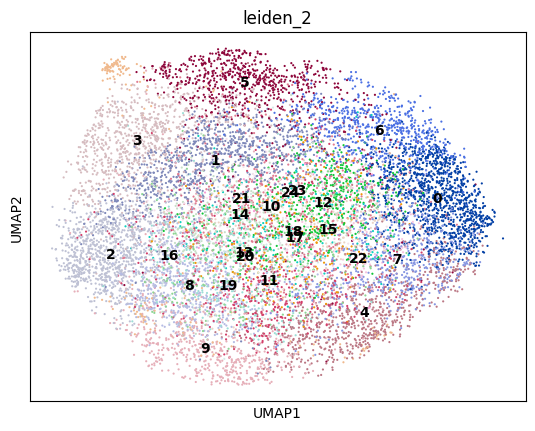

In [196]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

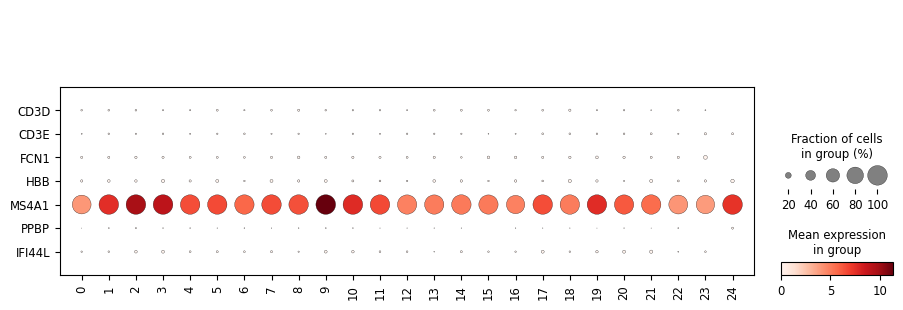

In [197]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

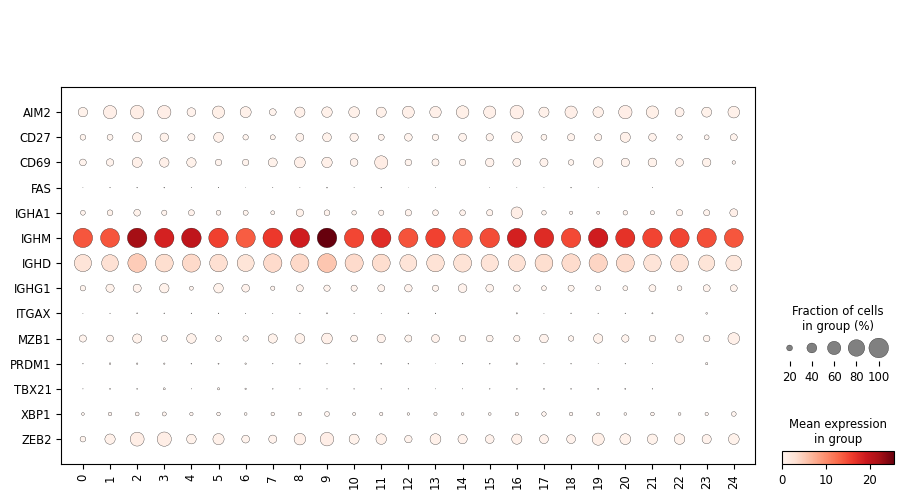

In [198]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

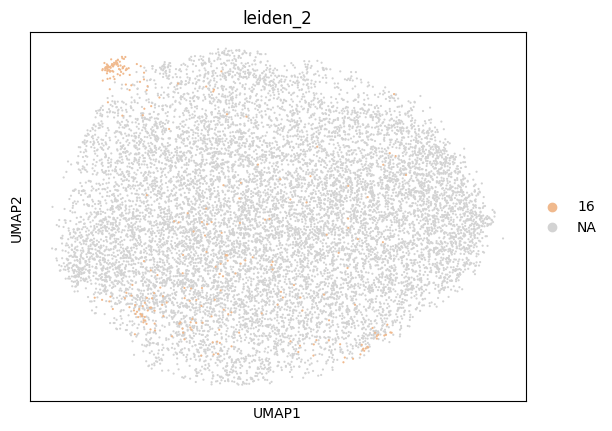

In [199]:
sc.pl.umap(adata, color = 'leiden_2', groups = '16')

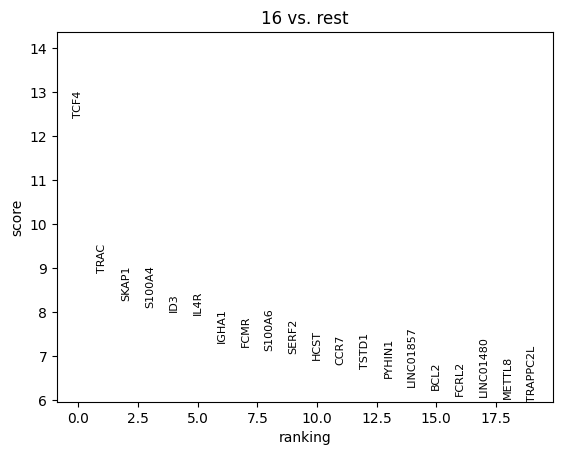

In [200]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['16']
)
sc.pl.rank_genes_groups(adata)

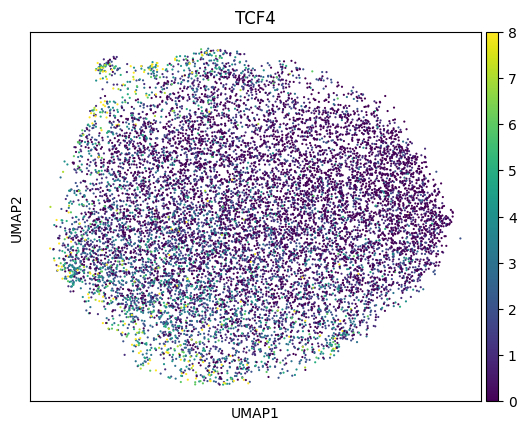

In [201]:
sc.pl.umap(adata, color = ['TCF4'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [122]:
adata = add_labels(adata, original_df)

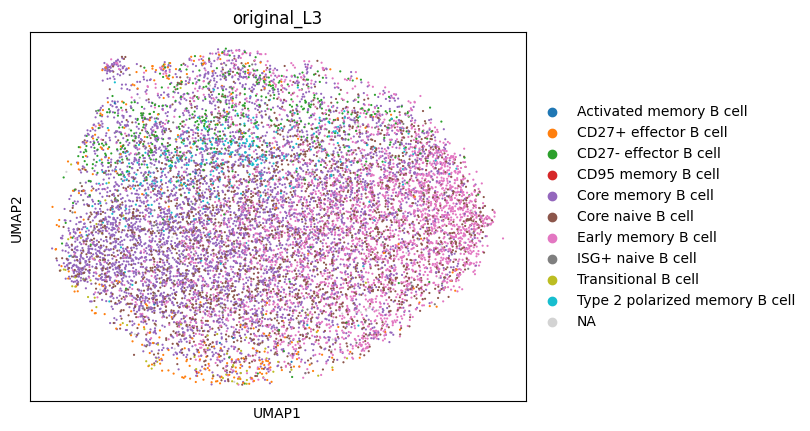

In [123]:
sc.pl.umap(adata, color = 'original_L3')

In [124]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core memory B cell                4927
Early memory B cell               3499
Core naive B cell                 2409
CD27- effector B cell              513
Type 2 polarized memory B cell     315
CD27+ effector B cell              283
ISG+ naive B cell                  138
NaN                                107
Transitional B cell                 73
Activated memory B cell              8
CD95 memory B cell                   2
Name: count, dtype: int64

In [125]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core memory B cell                0.401418
Early memory B cell               0.285074
Core naive B cell                 0.196269
CD27- effector B cell             0.041796
Type 2 polarized memory B cell    0.025664
CD27+ effector B cell             0.023057
ISG+ naive B cell                 0.011243
NaN                               0.008718
Transitional B cell               0.005948
Activated memory B cell           0.000652
CD95 memory B cell                0.000163
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review ISG+ naive B cell

In [126]:
cell_type = 'ISG+ naive B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [127]:
type_uuid

'fd894389-e6f1-42b3-bb9e-ed0bb6494ffb'

In [128]:
adata = read_adata_uuid(type_uuid)

downloading fileID: fd894389-e6f1-42b3-bb9e-ed0bb6494ffb
Files have been successfully downloaded!


### Clustering

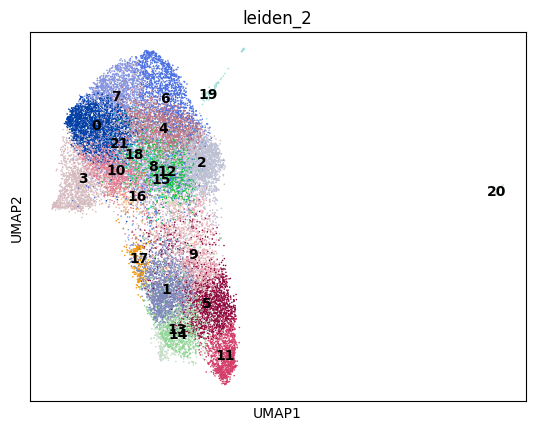

In [129]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

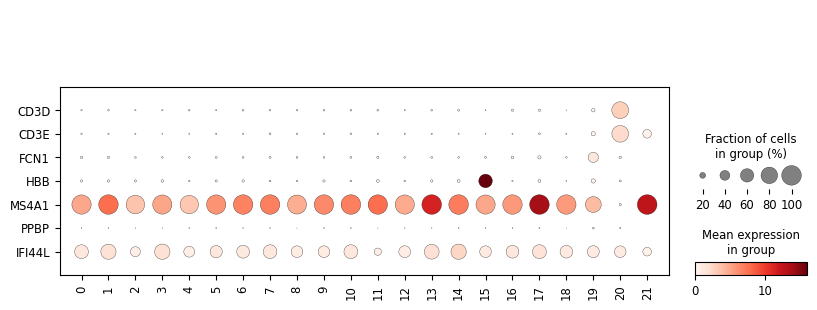

In [130]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

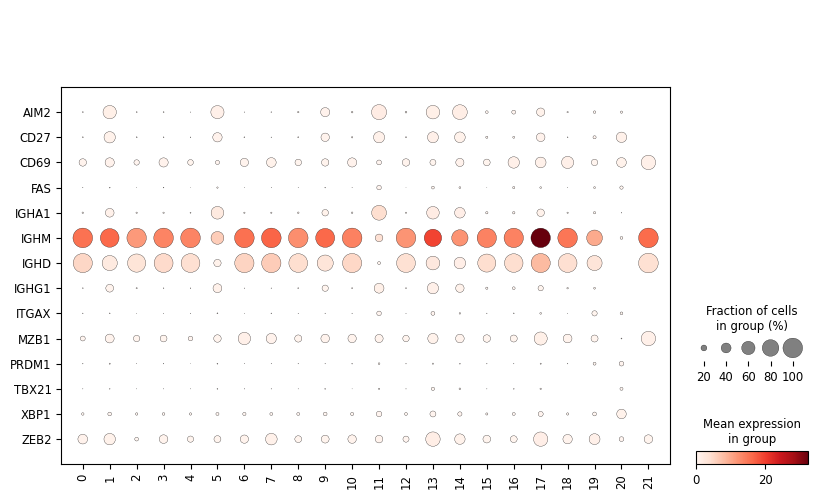

In [131]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [132]:
adata = add_labels(adata, original_df)

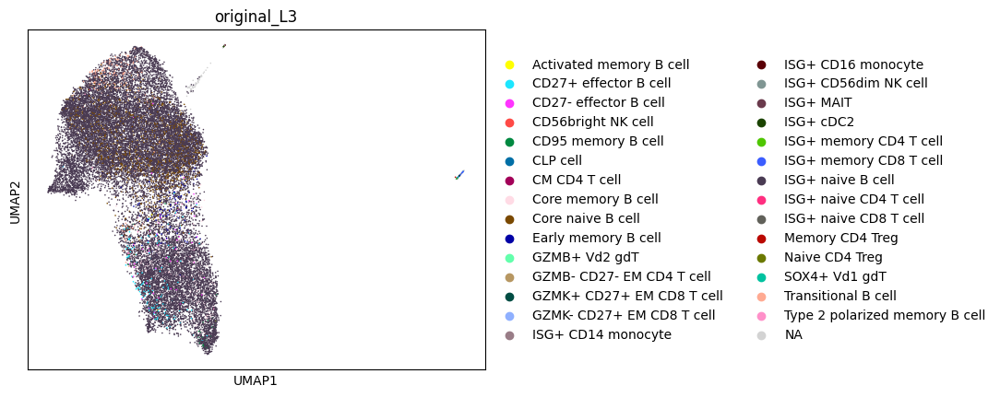

In [133]:
sc.pl.umap(adata, color = 'original_L3')

In [134]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ naive B cell                 20585
Core naive B cell                  1521
Core memory B cell                  463
NaN                                 241
Transitional B cell                 210
CD27+ effector B cell               147
Early memory B cell                 114
CD27- effector B cell                50
CD95 memory B cell                   50
Type 2 polarized memory B cell       28
ISG+ memory CD8 T cell               14
ISG+ memory CD4 T cell                8
ISG+ naive CD8 T cell                 5
ISG+ cDC2                             5
ISG+ CD14 monocyte                    5
Activated memory B cell               4
GZMK+ CD27+ EM CD8 T cell             3
ISG+ naive CD4 T cell                 3
CM CD4 T cell                         3
ISG+ CD16 monocyte                    3
ISG+ MAIT                             2
GZMB- CD27- EM CD4 T cell             2
SOX4+ Vd1 gdT                         2
CLP cell                              2
ISG+ CD56dim NK cell        

In [135]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ naive B cell                 0.876853
Core naive B cell                 0.064790
Core memory B cell                0.019722
NaN                               0.010266
Transitional B cell               0.008945
CD27+ effector B cell             0.006262
Early memory B cell               0.004856
CD27- effector B cell             0.002130
CD95 memory B cell                0.002130
Type 2 polarized memory B cell    0.001193
ISG+ memory CD8 T cell            0.000596
ISG+ memory CD4 T cell            0.000341
ISG+ naive CD8 T cell             0.000213
ISG+ cDC2                         0.000213
ISG+ CD14 monocyte                0.000213
Activated memory B cell           0.000170
GZMK+ CD27+ EM CD8 T cell         0.000128
ISG+ naive CD4 T cell             0.000128
CM CD4 T cell                     0.000128
ISG+ CD16 monocyte                0.000128
ISG+ MAIT                         0.000085
GZMB- CD27- EM CD4 T cell         0.000085
SOX4+ Vd1 gdT                     0.000085

### Proposed updates

- Remove high FCN1 cluster (21) as myeloid doublet
- Remove high CD3D cluster (22) as T cell doublet

## Review Plasma cell

In [136]:
cell_type = 'Plasma cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [137]:
type_uuid

'4686e852-aa10-4a7c-bd89-db7c394ff883'

In [138]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 4686e852-aa10-4a7c-bd89-db7c394ff883
Files have been successfully downloaded!


### Clustering

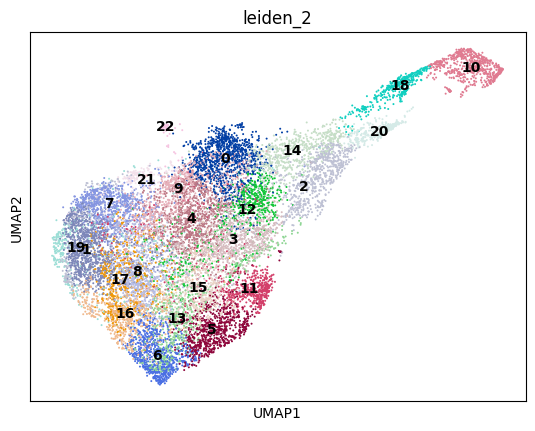

In [139]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

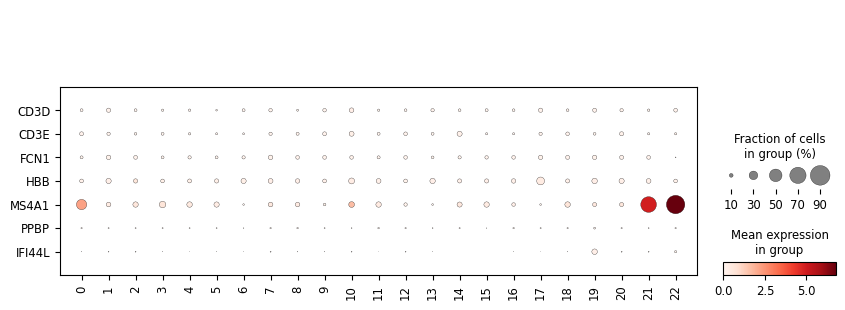

In [140]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

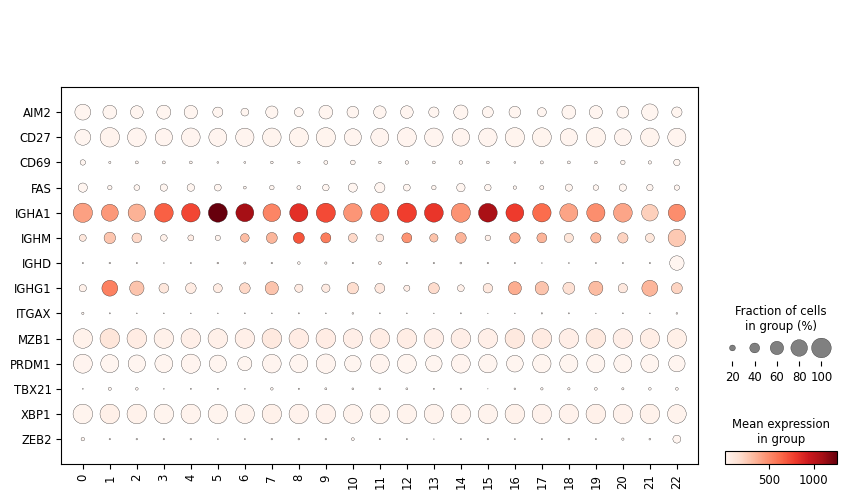

In [141]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

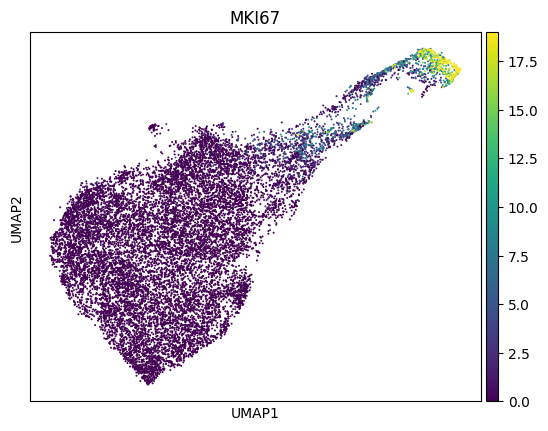

In [142]:
sc.pl.umap(adata, color = 'MKI67', vmax = 'p99')

### Cluster counts

In [143]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1042
1      996
2      981
3      889
4      864
5      771
6      741
7      734
8      723
9      695
10     678
11     617
12     604
13     572
14     568
15     554
16     543
17     542
18     377
19     369
20     301
21     258
22      80
Name: count, dtype: int64

### Comparison to original labels

In [144]:
adata = add_labels(adata, original_df)

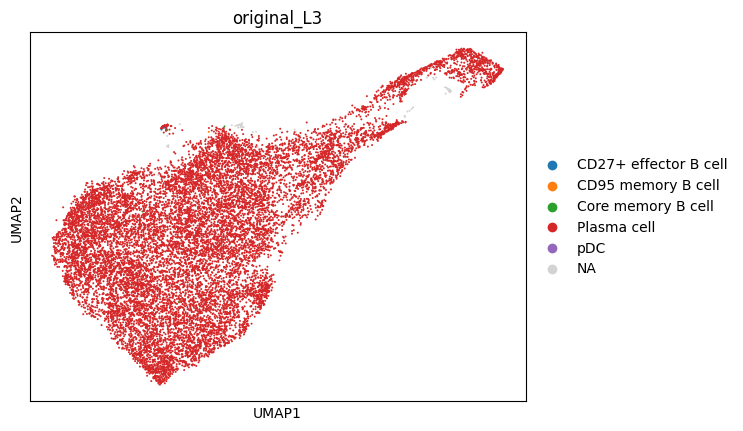

In [145]:
sc.pl.umap(adata, color = 'original_L3')

In [146]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Plasma cell              14384
NaN                        107
Core memory B cell           4
CD27+ effector B cell        2
CD95 memory B cell           1
pDC                          1
Name: count, dtype: int64

In [147]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Plasma cell              0.992068
NaN                      0.007380
Core memory B cell       0.000276
CD27+ effector B cell    0.000138
CD95 memory B cell       0.000069
pDC                      0.000069
Name: count, dtype: float64

### Proposed updates

- Remove CD20/MS4A1+ clusters (21-22) as Mislabeled B cells?

## Review Transitional B cell

In [148]:
cell_type = 'Transitional B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [149]:
type_uuid

'd05993c1-71fa-4f03-a5e9-57f586a369ce'

In [150]:
adata = read_adata_uuid(type_uuid)

downloading fileID: d05993c1-71fa-4f03-a5e9-57f586a369ce
Files have been successfully downloaded!


### Clustering

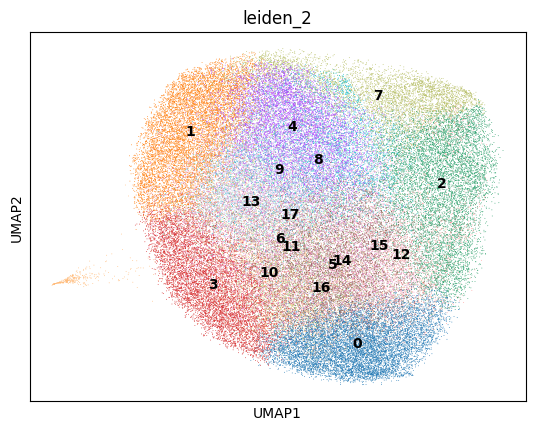

In [151]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

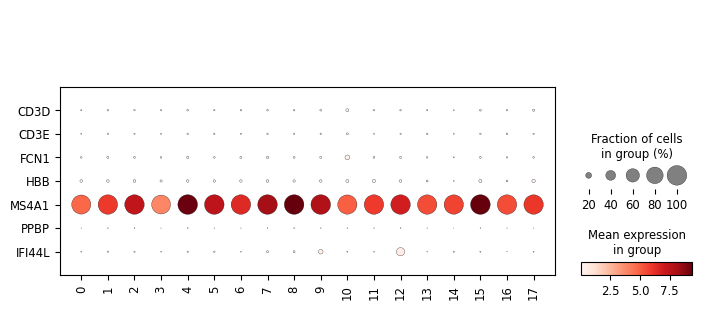

In [152]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

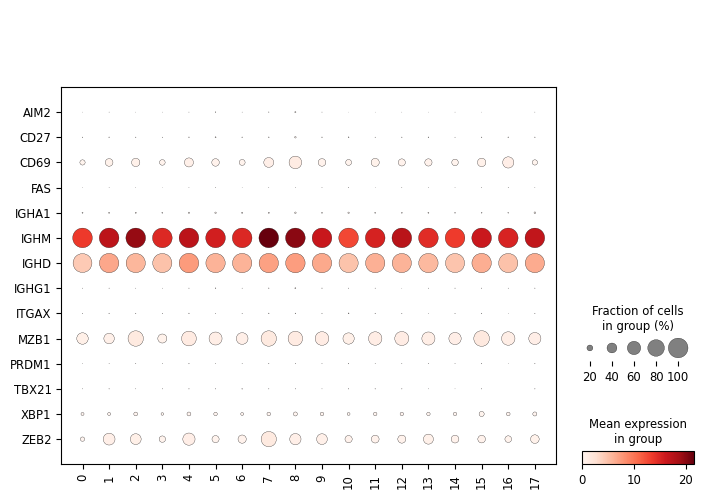

In [153]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [154]:
adata = add_labels(adata, original_df)

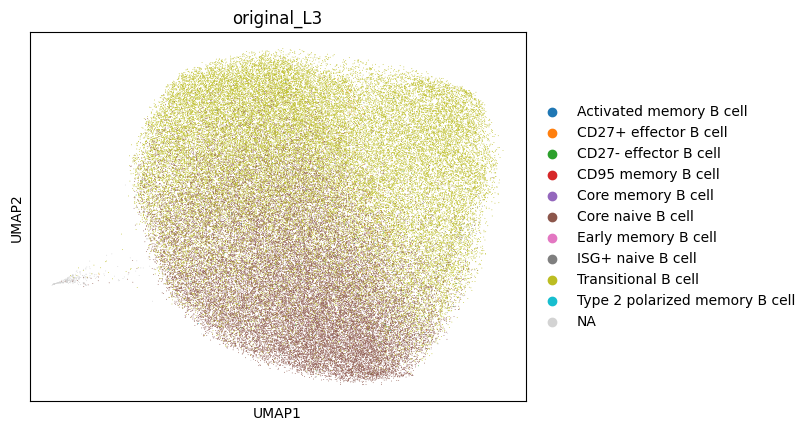

In [155]:
sc.pl.umap(adata, color = 'original_L3')

In [156]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Transitional B cell               46369
Core naive B cell                 33220
NaN                                 964
ISG+ naive B cell                   504
CD27+ effector B cell               128
CD27- effector B cell               106
Early memory B cell                  42
Core memory B cell                   41
CD95 memory B cell                   16
Activated memory B cell              10
Type 2 polarized memory B cell       10
Name: count, dtype: int64

In [157]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Transitional B cell               0.569574
Core naive B cell                 0.408058
NaN                               0.011841
ISG+ naive B cell                 0.006191
CD27+ effector B cell             0.001572
CD27- effector B cell             0.001302
Early memory B cell               0.000516
Core memory B cell                0.000504
CD95 memory B cell                0.000197
Activated memory B cell           0.000123
Type 2 polarized memory B cell    0.000123
Name: count, dtype: float64

### Proposed updates

Iteratively cluster to remove IFI44L+ cells in cluster 12
- reassign to ISG+ naive B cell

## Review Type 2 polarized memory B cell

In [158]:
cell_type = 'Type 2 polarized memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [159]:
type_uuid

'70fee941-67ec-49ba-b349-0c68b9100baf'

In [160]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 70fee941-67ec-49ba-b349-0c68b9100baf
Files have been successfully downloaded!


### Clustering

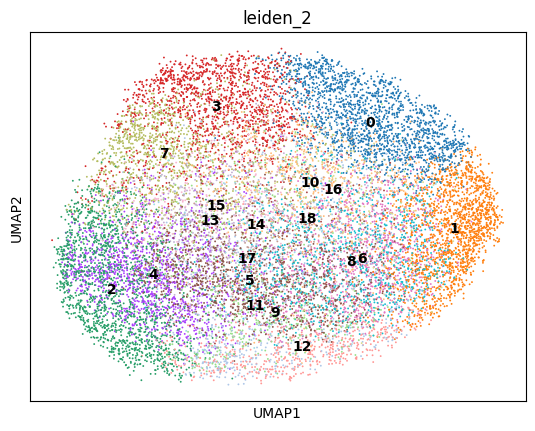

In [161]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

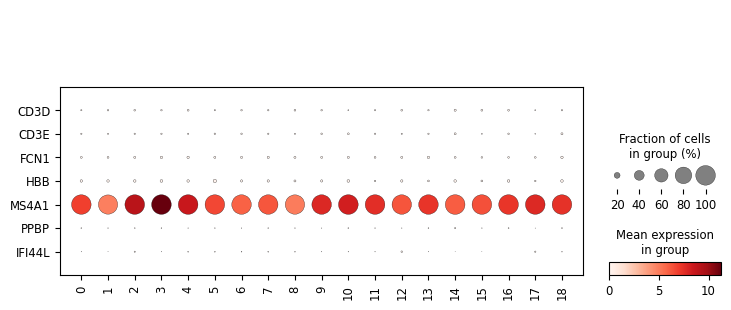

In [162]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

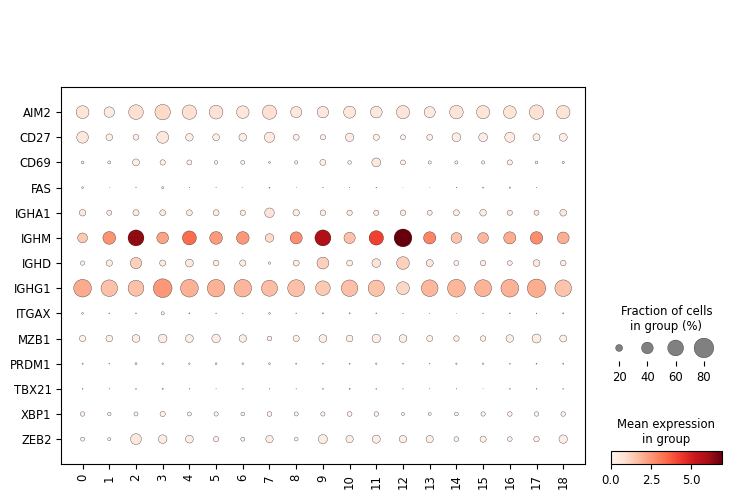

In [163]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [164]:
adata = add_labels(adata, original_df)

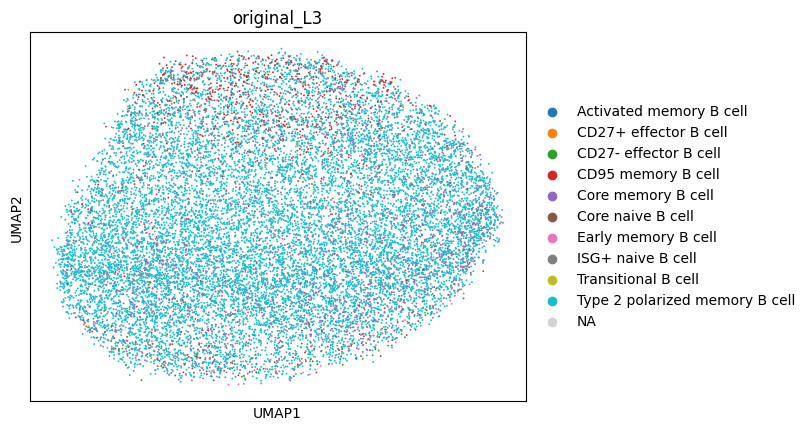

In [165]:
sc.pl.umap(adata, color = 'original_L3')

In [166]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Type 2 polarized memory B cell    13365
Core memory B cell                 2003
CD95 memory B cell                  759
Core naive B cell                   351
CD27- effector B cell                78
ISG+ naive B cell                    47
Early memory B cell                  37
NaN                                  34
CD27+ effector B cell                23
Activated memory B cell              14
Transitional B cell                   1
Name: count, dtype: int64

In [167]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Type 2 polarized memory B cell    0.799725
Core memory B cell                0.119854
CD95 memory B cell                0.045416
Core naive B cell                 0.021003
CD27- effector B cell             0.004667
ISG+ naive B cell                 0.002812
Early memory B cell               0.002214
NaN                               0.002034
CD27+ effector B cell             0.001376
Activated memory B cell           0.000838
Transitional B cell               0.000060
Name: count, dtype: float64

### Proposed updates

No proposed changes

In [278]:
os.system('jupyter nbconvert --to html --template pj 11a-Python_review_L3_b_cell_data.ipynb')

[NbConvertApp] WARNING | Config option `kernel_spec_manager_class` not recognized by `NbConvertApp`.
[NbConvertApp] Converting notebook 11a-Python_review_L3_b_cell_data.ipynb to html
[NbConvertApp] Writing 25667132 bytes to 11a-Python_review_L3_b_cell_data.html


0

In [279]:
import session_info
session_info.show()